In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
from shapely import wkt

from spopt.region.skater import Skater
import hdbscan
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import folium
from folium.plugins import Fullscreen
import mapclassify
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
def load_borough(filepath):
    df = pd.read_csv(filepath)
    df["geometry"] = df["geometry"].apply(wkt.loads)
    df = gpd.GeoDataFrame(df, geometry="geometry")
    
    return df

mht = load_borough("./data/mht_data.csv")
bk = load_borough("./data/bk_data.csv")

In [3]:
df = mht.append(bk)

In [4]:
df.head()

,Unnamed: 0,cb2020,borocode,boroname,ct2020,bctcb2020,geoid,shape_leng,shape_area,geometry,...,sub_entr_count,rw_length,rw_avg_elev,lake_res_ind,pond_ind,river_ind,stream_ind,wl_marsh_ind,beach_shore_ind,bay_ocean_ind
0,0,1000,1,Manhattan,100,10001001000,360610001001000,6627.858318,1.204255e+06,"POLYGON ((973172.666 194632.348, 973310.630 19...",...,NaN,NaN,NaN,0,0,1,0,0,0,1
1,1,1001,1,Manhattan,100,10001001001,360610001001001,4395.190183,6.401664e+05,"POLYGON ((972081.788 190733.467, 972184.766 19...",...,NaN,NaN,NaN,0,0,0,0,0,1,1
2,2,1000,1,Manhattan,201,10002011000,360610002011000,1569.384823,1.292763e+05,"POLYGON ((988376.731 199328.618, 987837.811 19...",...,NaN,NaN,NaN,0,0,0,0,0,0,0
3,3,1001,1,Manhattan,201,10002011001,360610002011001,1594.262855,1.393604e+05,"POLYGON ((988392.400 199070.298, 988285.301 19...",...,NaN,NaN,NaN,0,0,0,0,0,0,0
4,4,2000,1,Manhattan,201,10002012000,360610002012000,2055.295961,2.633084e+05,"POLYGON ((988422.186 198807.188, 988449.289 19...",...,NaN,NaN,NaN,0,0,0,0,0,0,0


<AxesSubplot:>

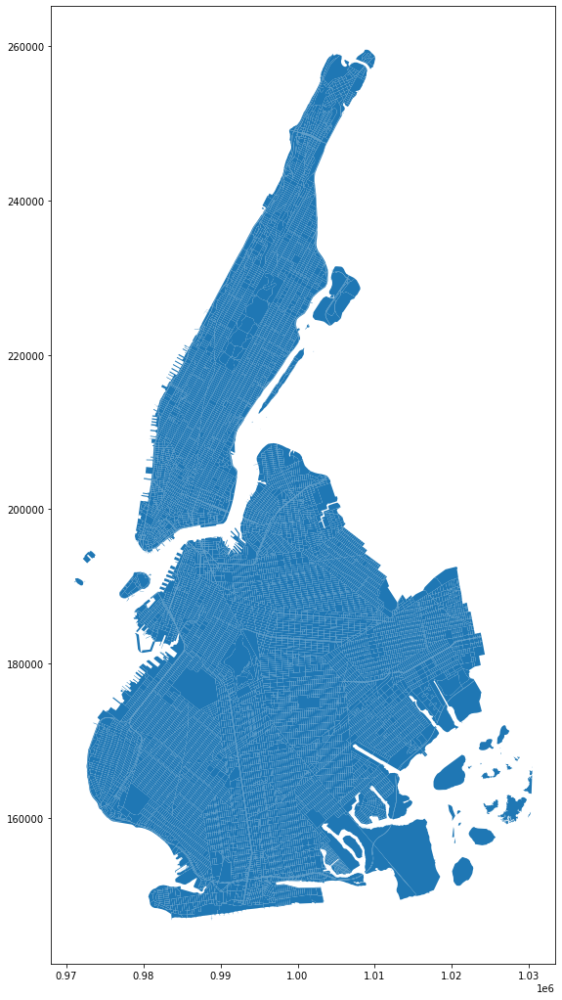

In [5]:
df.plot(figsize =(20, 18))

In [6]:
df.shape

(13699, 50)

In [7]:
cluster = hdbscan.HDBSCAN(min_cluster_size=12)

In [8]:
df["catch_basin_count"] = df["catch_basin_count"].fillna(0)

In [9]:
df.columns

Index(['Unnamed: 0', 'cb2020', 'borocode', 'boroname', 'ct2020', 'bctcb2020',
       'geoid', 'shape_leng', 'shape_area', 'geometry', 'land_cvr_0',
       'land_cvr_1', 'land_cvr_2', 'land_cvr_3', 'land_cvr_4', 'land_cvr_5',
       'land_cvr_6', 'land_cvr_7', 'land_cvr_8', 'land_cvr_1_rb',
       'land_cvr_2_rb', 'land_cvr_3_rb', 'land_cvr_4_rb', 'land_cvr_5_rb',
       'land_cvr_6_rb', 'land_cvr_7_rb', 'land_cvr_8_rb', 'elev_mean',
       'elev_min', 'elev_max', 'elev_q1', 'elev_q3', 'ntaname', 'elev_mean_ct',
       'elev_min_ct', 'elev_max_ct', 'elev_q1_ct', 'elev_q3_ct',
       'catch_basin_count', 'catch_basin_density', 'sub_entr_count',
       'rw_length', 'rw_avg_elev', 'lake_res_ind', 'pond_ind', 'river_ind',
       'stream_ind', 'wl_marsh_ind', 'beach_shore_ind', 'bay_ocean_ind'],
      dtype='object')

In [10]:
scale_cols = [
    "elev_mean",
    "catch_basin_count"
]
mms = MinMaxScaler()
df[scale_cols] = mms.fit_transform(df[scale_cols])

In [11]:
df[scale_cols]

,elev_mean,catch_basin_count
0,0.018343,0.000000
1,0.030178,0.000000
2,0.134911,0.024390
3,0.133728,0.024390
4,0.120118,0.036585
...,...,...
9764,0.031361,0.121951
9765,0.133136,0.012195
9766,0.421302,0.512195
9767,0.047337,0.085366


In [12]:
columns = [
    "land_cvr_1_rb",
    "land_cvr_2_rb",
    "land_cvr_3_rb",
    "land_cvr_4_rb",
    "land_cvr_5_rb",
    "land_cvr_6_rb",
    "land_cvr_7_rb",
    "land_cvr_8_rb",
    "elev_mean",
    # "catch_basin_count"
    
]

In [13]:
df[columns]

,land_cvr_1_rb,land_cvr_2_rb,land_cvr_3_rb,land_cvr_4_rb,land_cvr_5_rb,land_cvr_6_rb,land_cvr_7_rb,land_cvr_8_rb,elev_mean
0,0.256364,0.219445,0.002031,0.004169,0.264899,0.001580,0.251513,0.0,0.018343
1,0.210609,0.229753,0.072203,0.009805,0.153031,0.000000,0.324600,0.0,0.030178
2,0.105964,0.055501,0.000000,0.000000,0.375244,0.192457,0.270832,0.0,0.134911
3,0.183447,0.011501,0.000000,0.000000,0.387656,0.190508,0.226889,0.0,0.133728
4,0.593330,0.035842,0.001721,0.000000,0.098893,0.145654,0.124560,0.0,0.120118
...,...,...,...,...,...,...,...,...,...
9764,0.328143,0.113600,0.000000,0.000000,0.154193,0.128976,0.275090,0.0,0.031361
9765,0.140668,0.005550,0.000000,0.000000,0.000000,0.559502,0.294279,0.0,0.133136
9766,0.364821,0.522264,0.000267,0.010402,0.003215,0.074132,0.024898,0.0,0.421302
9767,0.009465,0.027042,0.095117,0.000761,0.120400,0.056076,0.691138,0.0,0.047337


In [14]:
cluster.fit(df[columns])

HDBSCAN(min_cluster_size=12)

In [15]:
cluster.labels_.max()

13

In [16]:
df["cluster"] = cluster.labels_

<AxesSubplot:>

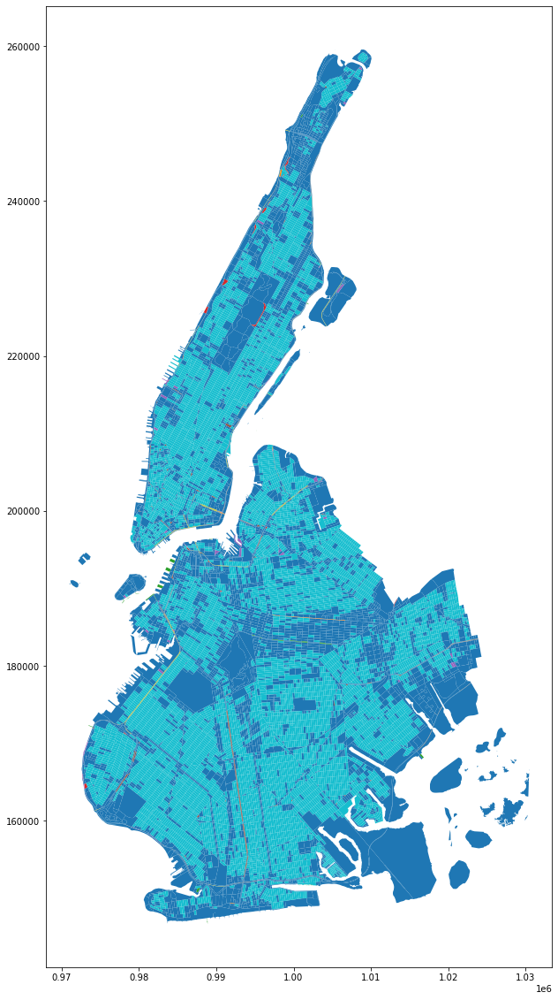

In [17]:
df.plot(column = "cluster",
        categorical=True,
        figsize = (25, 20))

In [18]:
df.crs

In [19]:
## Run if there is no current CRS for df
df = df.set_crs("EPSG:2263")
df = df.to_crs("WGS84")

In [20]:
df.rename({
    "land_cvr_1_rb":"tree_canopy_proportion",
    "land_cvr_2_rb":"grass_proportion",
    "land_cvr_3_rb":"soil_proportion",
    "land_cvr_4_rb":"water_proportion",
    "land_cvr_5_rb":"building_proportion",
    "land_cvr_6_rb":"road_proportion",
    "land_cvr_7_rb":"impervious_proportion",
    "land_cvr_8_rb":"railroad_proportion",
    
}, inplace = True)

In [21]:
m = folium.Map(location = (40.730610, -73.935242), tiles = "CartoDB dark_matter", zoom_start = 12)
Fullscreen().add_to(m)

In [22]:
columns.insert(0, "ntaname")
columns.insert(0, "geometry")
columns.insert(0, "cluster")

In [23]:
df_subset = gpd.GeoDataFrame(df[columns], geometry="geometry")

In [24]:
df_subset.explore(column = "cluster", m=m, categorical=True)